# Project 4: Cd-Aufnahme über die Nahrung bei Folsomia

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pal = sns.color_palette()
from scipy import stats
import pandas as pd
from copy import deepcopy
import pprint
pp = pprint.PrettyPrinter(indent=2)
import os
import pyarrow

current_dir = os.path.dirname(os.path.abspath(''))
project_directory = os.path.dirname(current_dir)

# automatische aktualisierung externer Python-Dateien
%load_ext autoreload
%autoreload 2 

# Einbindung zusätzlicher Funktionen 
from utils import * 
from ModelFitting import *
from mempyDEB.DEBODE.simulators import *
from mempyDEB.DEBODE.defaultparams import *

## Start by fitting the model to control data

In [2]:
from DEBfitting_Folsomia import *
data = load_data()
data.head()

,t_day,length_mm,C_F,T_cels,S
85,0,0.609,0,20,1.420620
86,2,0.723,0,20,1.999511
87,4,0.857,0,20,2.805551
88,7,1.019,0,20,3.960986
89,9,1.095,0,20,4.571232


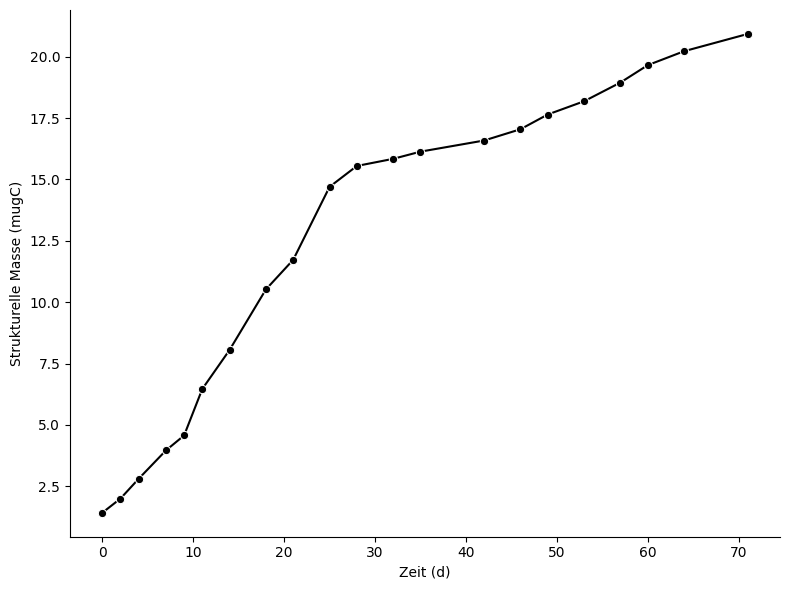

In [3]:
_ = plot_data(data)

Sdot:  0.0015315150637916072  Rdot:  0  Xdot_emb:  -0.005689076961374921  Xdot:  0  DDot_j: 0.0  Adot:  0.0018963589871249737  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.18227374479507097  Rdot:  0  Xdot_emb:  -0.6979135211499419  Xdot:  0  DDot_j: 0.0  Adot:  0.23263784038331395  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.0031800898695943723  Rdot:  0  Xdot_emb:  -0.011828473724061928  Xdot:  0  DDot_j: 0.0  Adot:  0.003942824574687309  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.005274923709659984  Rdot:  0  Xdot_emb:  -0.019644545438055598  Xdot:  0  DDot_j: 0.0  Adot:  0.006548181812685199  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.022141256268763537  Rdot:  0  Xdot_emb:  -0.08293976468190746  Xdot:  0  DDot_j: 0.0  Adot:  0.027646588227302486  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.029524786163985885  Rdot:  0  Xdot_emb:  -0.11079483184724635  Xdot:  0  DDot_j: 0.0  Adot:  0.03693161061574878  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.03269724320423096  Rdot:  0  Xdot_emb:  -0.12278527576888994  Xdot:  0  DDot_j: 0.0  Adot

c:\Users\hdeve\Documents\Master_Umsys_Rema_Osnabrück\Semester_1\Mechanistische_Effekt_Modellierung\Übung\mem25\Projekt\mempyDEB\DEBfitting_Folsomia.py:89: RuntimeWarning: invalid value encountered in scalar power
  p.spc['Idot_max_rel_emb'] *= zoom_factor_theta**(1/3)


Sdot:  0.0006802606621128678  Rdot:  0  Xdot_emb:  -0.0025245279016101107  Xdot:  0  DDot_j: 0.0  Adot:  0.0008415093005367035  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.050591480491945985  Rdot:  0  Xdot_emb:  -0.1981864681990468  Xdot:  0  DDot_j: 0.0  Adot:  0.06606215606634894  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.001098521215838399  Rdot:  0  Xdot_emb:  -0.004084182146055993  Xdot:  0  DDot_j: 0.0  Adot:  0.001361394048685331  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.0015083901958281383  Rdot:  0  Xdot_emb:  -0.005616307927571764  Xdot:  0  DDot_j: 0.0  Adot:  0.0018721026425239213  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.004272328188846383  Rdot:  0  Xdot_emb:  -0.016018101591629034  Xdot:  0  DDot_j: 0.0  Adot:  0.005339367197209678  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.0054516844010276296  Rdot:  0  Xdot_emb:  -0.020485531655522284  Xdot:  0  DDot_j: 0.0  Adot:  0.006828510551840761  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.005933190454867121  Rdot:  0  Xdot_emb:  -0.02231369045877661  Xdot:  0  DDot_j: 0

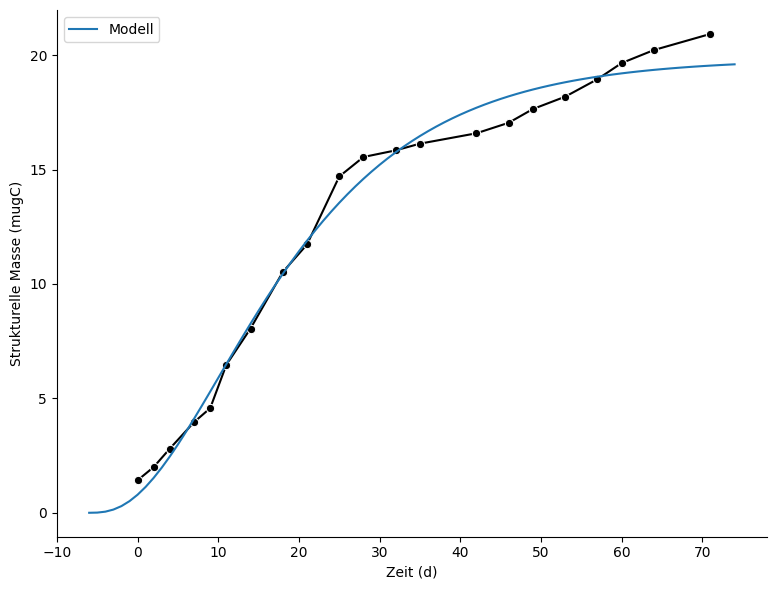

In [4]:
f = fit_model()

Sdot:  0.0015315150637916072  Rdot:  0  Xdot_emb:  -0.005689076961374921  Xdot:  0  DDot_j: 0.0  Adot:  0.0018963589871249737  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.18227374479507097  Rdot:  0  Xdot_emb:  -0.6979135211499419  Xdot:  0  DDot_j: 0.0  Adot:  0.23263784038331395  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.0031800898695943723  Rdot:  0  Xdot_emb:  -0.011828473724061928  Xdot:  0  DDot_j: 0.0  Adot:  0.003942824574687309  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.005274923709659984  Rdot:  0  Xdot_emb:  -0.019644545438055598  Xdot:  0  DDot_j: 0.0  Adot:  0.006548181812685199  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.022141256268763537  Rdot:  0  Xdot_emb:  -0.08293976468190746  Xdot:  0  DDot_j: 0.0  Adot:  0.027646588227302486  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.029524786163985885  Rdot:  0  Xdot_emb:  -0.11079483184724635  Xdot:  0  DDot_j: 0.0  Adot:  0.03693161061574878  Cd_in:  0.0  Cd_indot:  0
Sdot:  0.03269724320423096  Rdot:  0  Xdot_emb:  -0.12278527576888994  Xdot:  0  DDot_j: 0.0  Adot

c:\Users\hdeve\Documents\Master_Umsys_Rema_Osnabrück\Semester_1\Mechanistische_Effekt_Modellierung\Übung\mem25\Projekt\mempyDEB\DEBfitting_Folsomia.py:89: RuntimeWarning: invalid value encountered in scalar power
  p.spc['Idot_max_rel_emb'] *= zoom_factor_theta**(1/3)


Sdot:  1.2614481123972168  Rdot:  0  Xdot_emb:  0  Xdot:  9999999994.053917  DDot_j: 0.0  Adot:  1.9820278790252621  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.2924204372171526  Rdot:  0  Xdot_emb:  0  Xdot:  9999999993.866016  DDot_j: 0.0  Adot:  2.0446608985077024  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.4394956383468382  Rdot:  0  Xdot_emb:  0  Xdot:  9999999992.93841  DDot_j: 0.0  Adot:  2.3538636381944995  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.4670259552619231  Rdot:  0  Xdot_emb:  0  Xdot:  9999999992.7579  DDot_j: 0.0  Adot:  2.4140335037755984  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.4983598137918246  Rdot:  0  Xdot_emb:  0  Xdot:  9999999992.549648  DDot_j: 0.0  Adot:  2.483450561184677  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.4956698312372894  Rdot:  0  Xdot_emb:  0  Xdot:  9999999992.567646  DDot_j: 0.0  Adot:  2.4774514592055277  Cd_in:  0.0  Cd_indot:  0.0
Sdot:  1.561961910791677  Rdot:  0  Xdot_emb:  0  Xdot:  9999999992.1174  DDot_j: 0.0  Adot:  2.627533830885789  Cd_in:  0.0  Cd_indot

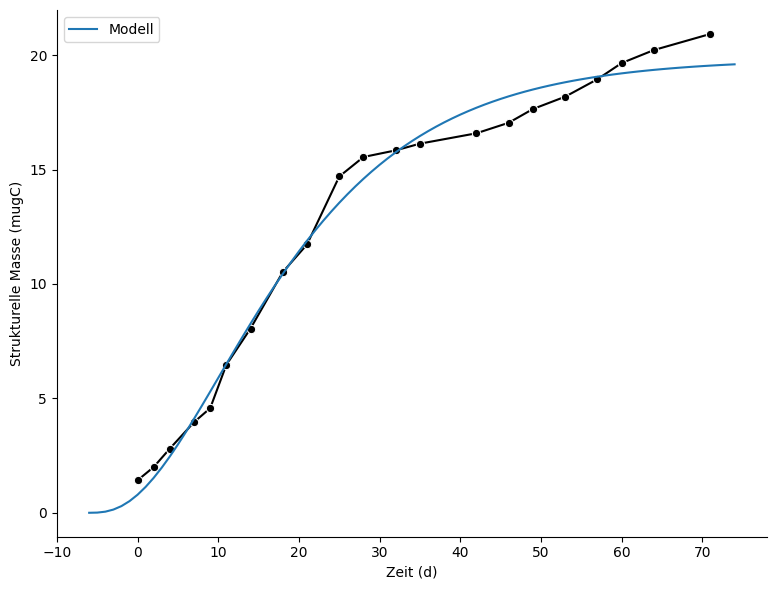

In [5]:
def fit_model_2params():
    """
    DEB-Modellkalibrierung mit zwei Parametern.
    """

    # Definition des ModelFit - Objektes wie zuvor
    f = setup_modelfit() 
    
    # wir müssen hier lediglich den initial guess anpassen
    f.intguess = { 
        'Idot_max_rel' : f.defaultparams.spc['Idot_max_rel'], 
        'eta_AS_0' : f.defaultparams.spc['eta_AS_0']
    }

    # am restlichen Code ändert sich ersmtal nichts

    f.run_optimization()

    print(f"Estimated parameter values: {f.p_opt}")

    # simulate optimized parameters, 

    p = deepcopy(f.defaultparams)
    p.spc.update(f.p_opt)  

    sim_opt = f.simulator(p.spc)

    # plot data + retrodiction

    fig, ax = plot_data(f.data)

    sns.lineplot(sim_opt, x = 't_day', y = 'S', ax = ax, label = "Modell")
    #sns.lineplot(sim_opt, x = 't_day', y = 'cum_repro', ax = ax[1])

    #ax[1].legend()

    return f
 
f_2params = fit_model_2params()

control_fitted_params = f_2params.p_opt


In [6]:
#control_fitted_params
f_2params

ModelFit(data=     t_day  length_mm  C_F  T_cels          S  S_scaled
85       0   0.609000    0      20   1.420620  0.067888
86       2   0.723000    0      20   1.999511  0.095551
87       4   0.857000    0      20   2.805551  0.134070
88       7   1.019000    0      20   3.960986  0.189285
89       9   1.095000    0      20   4.571232  0.218447
90      11   1.303000    0      20   6.463825  0.308889
91      14   1.455000    0      20   8.052735  0.384818
92      18   1.664000    0      20  10.521017  0.502771
93      21   1.757000    0      20  11.724806  0.560297
94      25   1.968000    0      20  14.696648  0.702313
95      28   2.024444    0      20  15.548253  0.743009
96      32   2.043333    0      20  15.838573  0.756883
97      35   2.062222    0      20  16.131567  0.770884
98      42   2.091111    0      20  16.584849  0.792545
99      46   2.120000    0      20  17.044385  0.814505
100     49   2.157143    0      20  17.644408  0.843179
101     53   2.190000    0      20

### Bayesian Inference

In [7]:
# f.define_lognorm_prior()
# f.run_bayesian_inference(
#     popsize = 35,
#     max_total_nr_simulations = 1_000)

In [8]:
# f.retrodict()
# fig,ax = plot_data(f.data)

# for df in f.retrodictions:
    
#     sns.lineplot(df, x = 't_day', y = 'S', ax = ax, alpha = .2, color = 'gray')

## use control fit to fit TKTD model

In [22]:
from TKTDFitting_Folsomia import *
from mempyDEB.DEBODE.simulators import *
from mempyDEB.DEBODE.defaultparams import *

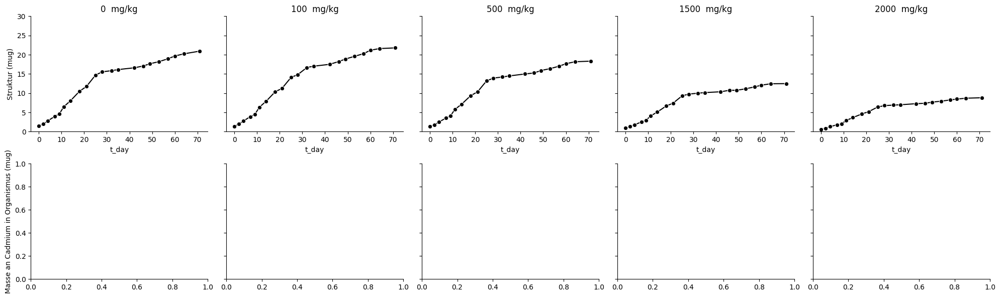

In [10]:
data = load_data()
fig, ax = plot_data(data)


In [9]:
f = setup_modelfit(pmoa = 'G')
f.defaultparams.spc.update(control_fitted_params)
f.intguess = {
        'ex_cd': 0.02,
        'ED50_j' : 1000, 
        'beta_j' : 2, 
        }
sim = f.run_optimization() # führe Kalibrierung mittels lokaler Optimisierung durch

print(f"Estimated parameter values: {f.p_opt}")
# Simulation optimisierter Parameter
p = deepcopy(f.defaultparams)
p.spc.update(f.p_opt)  
sim_opt = f.simulator(p.spc)

# Visual predictive check

fig, ax = plot_data(f.data)
ax = plot_sim(ax, sim_opt)

KeyboardInterrupt: 

Fitted model using Nelder-Mead method. Results stored in `optimization_result`
Estimated parameter values: {'ED50_j': np.float64(521.4605622969294), 'beta_j': np.float64(0.911675601257318)}


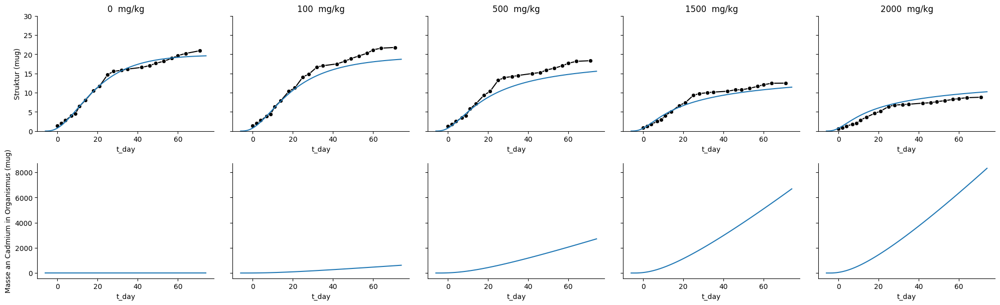

In [13]:
f = setup_modelfit(pmoa = 'G')
f.defaultparams.spc.update(control_fitted_params)
f.intguess = {
        'ED50_j' : 1000,
        'beta_j' : 2.
        }
sim = f.run_optimization() # führe Kalibrierung mittels lokaler Optimisierung durch

print(f"Estimated parameter values: {f.p_opt}")
# Simulation optimisierter Parameter
p = deepcopy(f.defaultparams)
p.spc.update(f.p_opt)  
sim_opt = f.simulator(p.spc)

# Visual predictive check

fig, ax = plot_data(f.data)
ax = plot_sim(ax, sim_opt)

[np.float64(0.022156942160583726), np.float64(0.022156944746909664), np.float64(0.02215694820820424), np.float64(0.02215695052037129), np.float64(0.02215695018422229), np.float64(0.022156940661020058), np.float64(0.022156929208230793), np.float64(0.02215692172348718), np.float64(0.022156916682599337), np.float64(0.02215691567524261), np.float64(0.022156926879354062), np.float64(0.02215694105141505), np.float64(0.022156947666165026), np.float64(0.0221569474936289), np.float64(0.022156950399222785), np.float64(0.02215693671707632), np.float64(0.022156943553776724), np.float64(0.022156940249987607), np.float64(0.022156937112022136), np.float64(0.02215693645119767), np.float64(0.022156935012024204), np.float64(0.022156934695540736), np.float64(0.022156935692232583), np.float64(0.02215693496749367), np.float64(0.022156935641017686), np.float64(0.022156936058587415), np.float64(0.022156934930097922), np.float64(0.022156928628656442), np.float64(0.02215692832044825), np.float64(0.022156904856

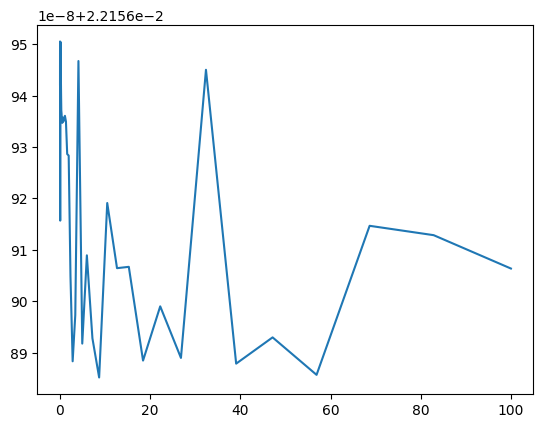

In [ ]:
# x = np.geomspace(1, np.median(EXPOSURES))
#x = np.linspace(0.01, 4)
x = np.geomspace(0.01, 100)
arr = []
f = setup_modelfit()
f.defaultparams.spc.update(control_fitted_params)
for i in x:
    f.intguess = {
            'ED50_j' : 0.7,
            'beta_j' : 1,
            'kD_j' : i
            }
    sim = f.simulator(f.intguess)
    arr.append(f.loss(sim, f.data))

print(arr)
fig, ax = plt.subplots()
ax.plot(x, arr)



In [ ]:
sim_opt = sim_opt.assign(cd_conc = lambda df : df.Cd_in / df.Scd_conc = lambda df : df.Cd_in / df.S)
sim_opt

SyntaxError: invalid syntax (3455101261.py, line 1)

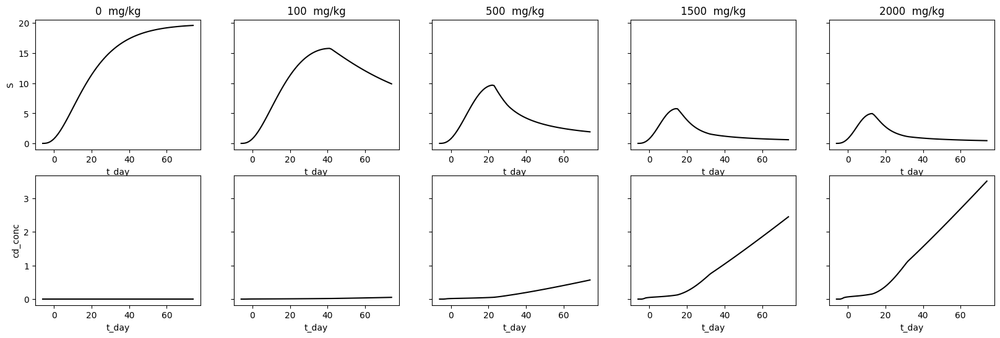

In [ ]:
fig, ax = plt.subplots(ncols = 5, nrows=2, figsize = (20,6), sharey = 'row')

for (i,C_W) in enumerate(sim_opt.C_W.unique()):

    ax[0,i].set(title = f'{C_W}  mg/kg')
    obs = sim_opt.loc[lambda df : df.C_W==C_W]
    
    sns.lineplot(obs, x = 't_day', y = 'S', ax = ax[0,i], color = 'black')
    sns.lineplot(obs, x = 't_day', y = 'cd_conc', ax = ax[1,i], color = 'black')
    

## trying out different PMoA

## fitting different levels of Cd-exposition from food ingestion/assimilation